# Calculate suspect score for manufacturing claims

# Problem statement

**Author** : Sunil Yadav || yadav.sunil83@gmail.com || +91 96206 38383 || 

# Solution Approach

 - Check if we can correctly segregate suspected claims
 - Prepare model

# Solution

## Lib Imports

In [1]:

import set_base_path
import numpy as np
import pandas as pd
from IPython.display import display
import plotly.figure_factory as ff
import plotly.graph_objects as go
from enum import Enum, auto
from typing import List, Sequence, Tuple
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import warnings
from src.constants import RAW_DATA_PATH, INTERIM_DATA_PATH
import src.utils.eda as eu
warnings.filterwarnings('ignore')

D:\ug\carrier\classification


In [2]:
# Ignore warnings


## Data load

In [3]:
# Load Data

merged_df: pd.DataFrame = pd.read_feather(INTERIM_DATA_PATH / "merged_df.feather")
claims_with_amount: pd.DataFrame = pd.read_feather(RAW_DATA_PATH / "claims_with_amount.feather")
labour: pd.DataFrame = pd.read_feather(RAW_DATA_PATH / "labour.feather")
parts_replaced: pd.DataFrame = pd.read_feather(RAW_DATA_PATH / "parts_replaced.feather")


## Pandas settings

In [4]:
pd.options.display.max_columns = 300
pd.options.display.max_rows = 300
pd.options.display.width = None
pd.options.display.max_colwidth = 100
pd.options.display.precision = 3


# EDA

## Data Overview

### Merged DF

In [5]:
# eu.get_data_frame_overview(merged_df)

In [6]:
pivoted_columns = list(labour['JOB_CODE'].unique()) + list(parts_replaced['INS_PART_CODE'].unique())
zeros = merged_df[pivoted_columns] == 0.
(((zeros).sum()*100)/merged_df.shape[0]).sort_values(ascending=False)


0300B0110              100.000
MH035634               100.000
BRZ/CT-9428-B CLAMP    100.000
QC000517               100.000
CLAMP 22108            100.000
                        ...   
MK668275                95.764
5458O01W1               95.443
0000B0138               92.749
0025A0135               90.259
0025B0188               84.413
Length: 6308, dtype: float64

In [7]:
# Claims Data

eu.get_data_frame_overview(claims_with_amount)

Shape:
(16636, 40)
--------------------------------------------------

DTypes:
CLAIM_NUMBER                  int64
FAILURE_DATE                 object
REPAIR_DATE                  object
FILED_ON_DATE                object
CLAIM_TYPE                   object
CLAIM_STATE                  object
DELIVERY_DATE                object
UNITS_USAGE                 float64
STOCK_RETAIL                 object
WARNTY_START_DATE            object
WARNTY_END_DATE              object
APPLICABLE_POLICY            object
REGISTRATION_DATE            object
SERIAL_NUMBER                object
DEALER_NUMBER                object
DEALER_NAME                  object
DEALER_CITY                  object
DEALER_STATE                 object
DEALER_COUNTRY               object
PARENT_DEALER                object
CLAIMED_AMOUNT              float64
CLAIM_PAID_AMOUNT           float64
PARTS_COST                  float64
TOTAL_NON_OEM_AMT           float64
LABOR_COST                  float64
OTHER_COST           

,CLAIM_NUMBER,FAILURE_DATE,REPAIR_DATE,FILED_ON_DATE,CLAIM_TYPE,CLAIM_STATE,DELIVERY_DATE,UNITS_USAGE,STOCK_RETAIL,WARNTY_START_DATE,WARNTY_END_DATE,APPLICABLE_POLICY,REGISTRATION_DATE,SERIAL_NUMBER,DEALER_NUMBER,DEALER_NAME,DEALER_CITY,DEALER_STATE,DEALER_COUNTRY,PARENT_DEALER,CLAIMED_AMOUNT,CLAIM_PAID_AMOUNT,PARTS_COST,TOTAL_NON_OEM_AMT,LABOR_COST,OTHER_COST,CLAIM_ID,CAUSAL_REG_PART,FAULT_CODE,FAULT_LOCN,FAULT_DESC (DAMAGE_CODE),BUSINESS_UNIT,REG_BRAND_NAME,REG_PRODUCT_FAMILY_NAME,PRODUCT_NAME,REG_SERIES_NAME,MODEL_NAME,PRODUCT_NAME.1,REG_MODEL_CODE,VARIANT
10604,201812771762,2018-11-20,2018-11-26,2018-12-29,VEHICLE,ACCEPTED_AND_CLOSED,2017-04-24,43473.0,RETAIL,2017-04-24,2025-04-23,STD_LDT_MDT_36M_200001,2017-07-14,JL6BNH1A1HK002072,D3040,WESTERN TRUCK EXCHANGE,LOS ANGELES,CA,USA,A0001544,637.58,637.58,121.58,0.0,516.0,0.0,110001789100380,QC000454,09130,"AIR CLEANER, TURBOCHARGER-ORIFICE, CRANKCASE VENTILATION",70 - OIL CONSUMPTION TOO HIGH,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,FEC72H,FEC72H CANTER,FEC72H-MFTA_TEMP_FE_SCAB,FEC72HL3SUHJ(FEC72H)-MFTA,FEC72HL3SUHJ(FEC72H)-MFTA
16158,201909059746,2019-06-20,2019-06-20,2019-09-08,VEHICLE,ACCEPTED_AND_CLOSED,2019-06-06,62341.0,RETAIL,2019-06-06,2024-06-05,STD_LDT_36M_36000M_TFGAS,2019-06-07,4UZBVE114KGKR9528,D3071,SEATTLE MITSUBISHI FUSO,SEATTLE,WA,USA,A0001544,123.50,123.50,3.50,0.0,120.0,0.0,110002026521060,MB060563,33227,"FRONT AXLE-GREASE CAP, FRONT WHEEL HUB",04 - LEAKS,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,BVE114K,BVE114K EAGLE,BVE114K-FERSL96NA06,FEC7TEL9SUH9(BVE114K),FEC7TEL9SUH9(BVE114K)
13466,202001167761,2019-11-27,2020-01-20,2020-01-22,VEHICLE,ACCEPTED_AND_CLOSED,2017-03-31,176618.0,RETAIL,2017-03-31,2025-03-30,STD_LDT_MDT_36M_200001,2018-05-24,JL6AME1A9HK002334,D2082,"CAPITAL FORD, INC.",RALEIGH,NC,USA,A0001544,1355.85,1355.85,198.55,0.0,1157.3,0.0,110002117957520,QC000527,14305,INTAKE EXHAUST MANIFOLD-EGR VALVE PIPE,04 - LEAKS,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,FEC52E,FEC52E CANTER,FEC52E-MFTA_TEMP_FE_SCAB,FEC52EL3SUHJ(FEC52E)-MFTA,FEC52EL3SUHJ(FEC52E)-MFTA
12596,201911124664,2019-11-21,2019-11-21,2019-11-22,VEHICLE,ACCEPTED_AND_CLOSED,2017-09-29,281435.0,RETAIL,2017-09-29,2025-09-28,STD_LDT_MDT_36M_200001,2018-04-17,JL6BNG1A6HK002823,D3091,"S.A.LONE STAR TRUCK & EQUIPMENT,INC",SAN ANTONIO,TX,USA,A0001544,888.57,888.57,678.57,0.0,210.0,0.0,110002081069340,QC000642,2001D,"ENGINE COOLING SYSTEM-VISCOUS FAN CLUTCH, CHARGE AIR COOLER",36 - NOISE,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,FEC72G,FEC72G CANTER,FEC72G-MFTA_TEMP_FE_SCAB,FEC72GL3SUHJ(FEC72G)-MFTA,FEC72GL3SUHJ(FEC72G)-MFTA
6333,201906967470,2019-05-22,2019-05-28,2019-06-01,VEHICLE,ACCEPTED_AND_CLOSED,2019-07-01,29156.0,RETAIL,2019-07-01,2027-06-30,None,2019-07-19,JL6CRH1A4JK002758,D1087,"COFFMAN INTERNATIONAL, INC.",DOTHAN,AL,USA,A0001544,210.00,210.00,0.00,0.0,210.0,0.0,110001939608660,None,88101,BODY EXTERIOR EQUIPMENT-FRONT BUMPER,36 - NOISE,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,FEC92H,FEC92H CANTER,FEC92H-MFTA_TEMP_FE_SCAB,FEC92HL3SUHK(FEC92H),FEC92HL3SUHK(FEC92H)


--------------------------------------------------

Head:



,CLAIM_NUMBER,FAILURE_DATE,REPAIR_DATE,FILED_ON_DATE,CLAIM_TYPE,CLAIM_STATE,DELIVERY_DATE,UNITS_USAGE,STOCK_RETAIL,WARNTY_START_DATE,WARNTY_END_DATE,APPLICABLE_POLICY,REGISTRATION_DATE,SERIAL_NUMBER,DEALER_NUMBER,DEALER_NAME,DEALER_CITY,DEALER_STATE,DEALER_COUNTRY,PARENT_DEALER,CLAIMED_AMOUNT,CLAIM_PAID_AMOUNT,PARTS_COST,TOTAL_NON_OEM_AMT,LABOR_COST,OTHER_COST,CLAIM_ID,CAUSAL_REG_PART,FAULT_CODE,FAULT_LOCN,FAULT_DESC (DAMAGE_CODE),BUSINESS_UNIT,REG_BRAND_NAME,REG_PRODUCT_FAMILY_NAME,PRODUCT_NAME,REG_SERIES_NAME,MODEL_NAME,PRODUCT_NAME.1,REG_MODEL_CODE,VARIANT
0,201808549750,2018-07-19,2018-07-20,2018-08-15,VEHICLE,ACCEPTED_AND_CLOSED,2013-09-27,243508.0,RETAIL,2013-09-27,2021-09-26,STD_LDT_CA_EMISSION_60M_100000MILE_200001,2017-03-13,JL6BNK1A1DK007764,D1099,MFTA INTERNAL,LOGAN TOWNSHIP,NJ,USA,A0001544,1090.68,1090.68,853.08,0.00,237.6,0.0,110001628242320,ME556056,09213,"AIR CLEANER, TURBOCHARGER-HOUSING, FUEL FILTER MODULE",D5 - SIEZED,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,FEC72K,FEC72K CANTER,FEC72K-MFTA_TEMP_FE_SCAB,FEC72KL3SUHD(FEC72K)-MFTA,FEC72KL3SUHD(FEC72K)-MFTA
1,201809570622,2018-08-21,2018-08-24,2018-09-11,VEHICLE,ACCEPTED_AND_CLOSED,2013-09-27,243508.0,RETAIL,2013-09-27,2021-09-26,STD_LDT_PT_60M_175000MILE_200001,2017-03-13,JL6BNK1A1DK007764,D1164,JUKONSKI TRUCK SALES AND SERVICE,MIDDLETOWN,CT,USA,A0001544,267.70,267.70,51.70,0.00,216.0,0.0,110001645711220,ME422856,07238,"CARBURETOR, INJECTION SYSTEM, FILTER-SENSOR, VOLUME AIR FLOW",74 - CONTACT FAULT/OPEN CIRCUIT,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,FEC72K,FEC72K CANTER,FEC72K-MFTA_TEMP_FE_SCAB,FEC72KL3SUHD(FEC72K)-MFTA,FEC72KL3SUHD(FEC72K)-MFTA
2,201808549786,2018-07-27,2018-08-01,2018-08-15,VEHICLE,ACCEPTED_AND_CLOSED,2013-12-13,131171.0,RETAIL,2013-12-13,2021-12-12,STD_LDT_CA_EMISSION_60M_100000MILE_200001,2017-03-13,JL6BPK1A5EK003244,D1099,MFTA INTERNAL,LOGAN TOWNSHIP,NJ,USA,A0001544,291.60,291.60,0.00,0.00,291.6,0.0,110001628262560,None,54581,"ELECTRICAL SYSTEM, EQUIPMENT AND INSTRUMENTS-CONTROL UNIT, DIESEL ENGINE",ZQ - UNKNOWN,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,FEC72K,FEC72K CANTER,FEC72K-MFTA_TEMP_FE_DCAB,FEC72KL3WUHD(FEC72K)-MFTA,FEC72KL3WUHD(FEC72K)-MFTA
3,201808549783,2018-07-27,2018-08-01,2018-08-15,VEHICLE,ACCEPTED_AND_CLOSED,2013-12-13,131171.0,RETAIL,2013-12-13,2021-12-12,STD_LDT_PT_60M_175000MILE_200001,2017-03-13,JL6BPK1A5EK003244,D1099,MFTA INTERNAL,LOGAN TOWNSHIP,NJ,USA,A0001544,3450.89,3450.89,2619.70,21.19,810.0,0.0,110001628259600,ME532035X,26855,MANUAL TRANSMISSION-T/M ASSY,06 - BROKEN,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,FEC72K,FEC72K CANTER,FEC72K-MFTA_TEMP_FE_DCAB,FEC72KL3WUHD(FEC72K)-MFTA,FEC72KL3WUHD(FEC72K)-MFTA
4,201809593233,2018-08-20,2018-09-12,2018-09-28,VEHICLE,ACCEPTED_AND_CLOSED,2014-01-24,160147.0,RETAIL,2014-01-24,2022-01-23,STD_LDT_CA_EMISSION_60M_100000MILE_200001,2017-03-13,JL6CRE1A3DK001121,D2149,"MIDWAY WESTERN STAR, INC.",KANSAS CITY,MO,USA,A0001544,564.01,736.21,57.95,63.26,615.0,0.0,110001647627300,QC000531,18124,"ENGINE LUBRICATION-FEED LINE, ENGINE OIL, TURBOCHARGER",04 - LEAKS,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,FEC92E,FEC92E CANTER,FEC92E-MFTA_TEMP_FE_SCAB,FEC92EL3SUHD(FEC92E)-MFTA,FEC92EL3SUHD(FEC92E)-MFTA


--------------------------------------------------

Tail:



,CLAIM_NUMBER,FAILURE_DATE,REPAIR_DATE,FILED_ON_DATE,CLAIM_TYPE,CLAIM_STATE,DELIVERY_DATE,UNITS_USAGE,STOCK_RETAIL,WARNTY_START_DATE,WARNTY_END_DATE,APPLICABLE_POLICY,REGISTRATION_DATE,SERIAL_NUMBER,DEALER_NUMBER,DEALER_NAME,DEALER_CITY,DEALER_STATE,DEALER_COUNTRY,PARENT_DEALER,CLAIMED_AMOUNT,CLAIM_PAID_AMOUNT,PARTS_COST,TOTAL_NON_OEM_AMT,LABOR_COST,OTHER_COST,CLAIM_ID,CAUSAL_REG_PART,FAULT_CODE,FAULT_LOCN,FAULT_DESC (DAMAGE_CODE),BUSINESS_UNIT,REG_BRAND_NAME,REG_PRODUCT_FAMILY_NAME,PRODUCT_NAME,REG_SERIES_NAME,MODEL_NAME,PRODUCT_NAME.1,REG_MODEL_CODE,VARIANT
16631,202007317386,2020-07-23,2020-07-23,2020-07-23,VEHICLE,ACCEPTED_AND_CLOSED,2020-01-28,39.0,RETAIL,2020-01-28,2025-01-27,STD_LDT_36M_36000M_TFGAS,2020-01-29,4UZBWH112LGLF4358,PP304,"REX 452, LLC./WHEELER LOGISTICS",GAFFNEY,SC,US,A0001544,21.55,21.55,8.95,0.00,12.6,0.0,110002239675020,MK450787,4307D,BRAKE VACUUM LINE-REAR LINE CONNECTOR,06 - BROKEN,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,FEC7TH,FEC7TH EAGLE,FEC7TH-FERSL96NA06,FEC7THL9WUH9(FEC7TH),FEC7THL9WUH9(FEC7TH)
16632,202007317287,2020-07-10,2020-07-20,2020-07-23,VEHICLE,ACCEPTED_AND_CLOSED,2020-03-13,17693.0,RETAIL,2020-03-13,2025-03-12,STD_LDT_36M_36000M_TFGAS,2020-03-14,4UZCXK110LGLW3143,D1192,"SYLVESTER TRUCK & TIRE SERVICE,LLC",AVON,OH,USA,A0001544,90.13,90.13,27.63,0.00,62.5,0.0,110002239588080,LT171B01,18365,"ENGINE LUBRICATION-OIL LINE, HIGH PRESSURE",04 - LEAKS,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,FEC9TK,FEC9TK EAGLE,FEC9TK-FERSL96NA06,FEC9TKL9SUH9(FEC9TK),FEC9TKL9SUH9(FEC9TK)
16633,202007308039,2020-06-02,2020-06-02,2020-07-11,VEHICLE,ACCEPTED_AND_CLOSED,2019-06-27,34219.0,RETAIL,2019-06-27,2024-06-26,STD_LDT_36M_36000M_TFGAS,2019-06-28,4UZBVG113KGKR9564,D9190,MAY'S FLEET SALES & SERVICE,SYRACUSE,NY,USA,A0001544,74.90,74.90,0.00,0.00,74.9,0.0,110002232119600,None,29011,"PEDAL ASSEMBLY-CABLE, CLUTCH",45 - SHIFTS HARD,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,BVG113K,BVG113K EAGLE,BVG113K-FERSL96NA06,FEC7TGL9SUH9(BVG113K),FEC7TGL9SUH9(BVG113K)
16634,202007300069,2020-06-17,2020-06-24,2020-07-02,VEHICLE,ACCEPTED_AND_CLOSED,2019-06-04,21034.0,RETAIL,2019-06-04,2024-06-03,STD_LDT_36M_36000M_TFGAS,2019-06-05,4UZBYE11XKGKM6565,D2133,"RENDEL'S, INC.",JOLIET,IL,USA,A0001544,1077.77,1077.77,706.06,20.71,351.0,0.0,110002226332800,ML296469,83421,"HEATER, FAN, AIR CONDITIONER-A/C COMPRESSOR",04 - LEAKS,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,BYE11XK,BYE11XK EAGLE,BYE11XK-FERSL96NA06,FECZTEL9SUH9(BYE11XK),FECZTEL9SUH9(BYE11XK)
16635,202006297254,2020-06-26,2020-06-29,2020-06-30,VEHICLE,ACCEPTED_AND_CLOSED,2019-01-15,18506.0,RETAIL,2019-01-15,2024-01-14,STD_LDT_36M_36000M_TFGAS,2019-01-16,4UZBVG119KGKK1497,D1050,"JIM REED'S TRUCK SALES, INC",CORTLANDT MANOR,NY,USA,A0001544,321.10,321.10,0.00,0.00,321.1,0.0,110002224096260,None,27903,AUTOMATIC TRANSMISSION-TRANSMISSION CONTROL GENERAL,45 - SHIFTS HARD,MFTBC,TRUCK,260,260 LIGHT DUTY TRUCK,BVG119K,BVG119K EAGLE,BVG119K-FERSL96NA06,FEC7TGL9SUH9(BVG119K),FEC7TGL9SUH9(BVG119K)


--------------------------------------------------

Describe:



,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CLAIM_NUMBER,1.66e+04,NaN,NaN,NaN,2.36e+11,2.47e+11,2.02e+11,2.02e+11,2.02e+11,2.02e+11,2.02e+12
FAILURE_DATE,16636,780,2018-12-03,55,NaN,NaN,NaN,NaN,NaN,NaN,NaN
REPAIR_DATE,16636,774,2018-08-31,78,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FILED_ON_DATE,16636,717,2018-08-31,136,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CLAIM_TYPE,16636,2,VEHICLE,15086,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CLAIM_STATE,16636,2,ACCEPTED_AND_CLOSED,15859,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DELIVERY_DATE,16636,2159,2017-12-29,173,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UNITS_USAGE,1.66e+04,NaN,NaN,NaN,1.17e+05,1.43e+05,3,4.08e+04,8.79e+04,1.58e+05,4.83e+06
STOCK_RETAIL,16636,1,RETAIL,16636,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WARNTY_START_DATE,16627,2151,2017-12-29,174,NaN,NaN,NaN,NaN,NaN,NaN,NaN


--------------------------------------------------

Info:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16636 entries, 0 to 16635
Data columns (total 40 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLAIM_NUMBER              16636 non-null  int64  
 1   FAILURE_DATE              16636 non-null  object 
 2   REPAIR_DATE               16636 non-null  object 
 3   FILED_ON_DATE             16636 non-null  object 
 4   CLAIM_TYPE                16636 non-null  object 
 5   CLAIM_STATE               16636 non-null  object 
 6   DELIVERY_DATE             16636 non-null  object 
 7   UNITS_USAGE               16627 non-null  float64
 8   STOCK_RETAIL              16636 non-null  object 
 9   WARNTY_START_DATE         16627 non-null  object 
 10  WARNTY_END_DATE           16627 non-null  object 
 11  APPLICABLE_POLICY         15237 non-null  object 
 12  REGISTRATION_DATE         16636 non-null  object 
 13  SE

None

--------------------------------------------------

Count of data types:



object     30
float64     7
int64       3
dtype: int64

--------------------------------------------------

Column Names:



Index(['CLAIM_NUMBER', 'FAILURE_DATE', 'REPAIR_DATE', 'FILED_ON_DATE',
       'CLAIM_TYPE', 'CLAIM_STATE', 'DELIVERY_DATE', 'UNITS_USAGE',
       'STOCK_RETAIL', 'WARNTY_START_DATE', 'WARNTY_END_DATE',
       'APPLICABLE_POLICY', 'REGISTRATION_DATE', 'SERIAL_NUMBER',
       'DEALER_NUMBER', 'DEALER_NAME', 'DEALER_CITY', 'DEALER_STATE',
       'DEALER_COUNTRY', 'PARENT_DEALER', 'CLAIMED_AMOUNT',
       'CLAIM_PAID_AMOUNT', 'PARTS_COST', 'TOTAL_NON_OEM_AMT', 'LABOR_COST',
       'OTHER_COST', 'CLAIM_ID', 'CAUSAL_REG_PART', 'FAULT_CODE', 'FAULT_LOCN',
       'FAULT_DESC (DAMAGE_CODE)', 'BUSINESS_UNIT', 'REG_BRAND_NAME',
       'REG_PRODUCT_FAMILY_NAME', 'PRODUCT_NAME', 'REG_SERIES_NAME',
       'MODEL_NAME', 'PRODUCT_NAME.1', 'REG_MODEL_CODE', 'VARIANT'],
      dtype='object')

### Univariate

#### value counts

In [8]:
cols_to_plot_cat = ['CLAIM_TYPE', 'CLAIM_STATE', 'APPLICABLE_POLICY', 'DEALER_NUMBER', 'DEALER_CITY', 'DEALER_STATE', 'DEALER_COUNTRY',
                    'CAUSAL_REG_PART', 'FAULT_CODE', 'FAULT_LOCN', 'REG_PRODUCT_FAMILY_NAME', 'REG_SERIES_NAME', 'MODEL_NAME', 'REG_MODEL_CODE', 'VARIANT']
eu.print_value_count_percents(claims_with_amount[cols_to_plot_cat])


Value Counts for CLAIM_TYPE


Value,Value Counts,Percent
VEHICLE,15086,90.68%
PARTS,1550,9.32%



Value Counts for CLAIM_STATE


Value,Value Counts,Percent
ACCEPTED_AND_CLOSED,15859,95.33%
DENIED_AND_CLOSED,777,4.67%



Value Counts for APPLICABLE_POLICY


Value,Value Counts,Percent
STD_LDT_MDT_36M_200001,7580,45.56%
STD_LDT_PT_60M_175000MILE_200001,1769,10.63%
STD_LDT_36M_36000M_TFGAS,1446,8.69%
STD_LDT_CA_EMISSION_60M_100000MILE_200001,1098,6.60%
STD_PARTS_12M_200001,1060,6.37%
STD_LDT_EMISSION_60M_50000MILE_200001,955,5.74%
EXW_LDT_NAFTA_EMISSION_84M_201102,536,3.22%
STD_LDT_EMISSION_60M_150000MILE_201101,462,2.78%
STD_BATTERY_12M_200001,111,0.67%
EXW_LDT_158307_84M_312500MILE_200001,91,0.55%



Value Counts for DEALER_NUMBER


Value,Value Counts,Percent
D1099,1024,6.16%
D2090,998,6.00%
D2011,695,4.18%
D2082,480,2.89%
D4042,457,2.75%
D3014,436,2.62%
D2003,425,2.55%
D1202,335,2.01%
D3063,327,1.97%
D1057,306,1.84%



Value Counts for DEALER_CITY


Value,Value Counts,Percent
LOGAN TOWNSHIP,1024,6.16%
TAMPA,998,6.00%
HODGKINS,695,4.18%
RALEIGH,480,2.89%
ANJOU,457,2.75%
PHILADELPHIA,450,2.70%
SAN JOSE,436,2.62%
COLUMBUS,425,2.55%
MESA,327,1.97%
WESTBURY,306,1.84%



Value Counts for DEALER_STATE


Value,Value Counts,Percent
FL,1799,10.81%
CA,1737,10.44%
NJ,1686,10.13%
NY,1485,8.93%
IL,1072,6.44%
QC,1007,6.05%
PA,716,4.30%
NC,672,4.04%
OH,670,4.03%
TX,624,3.75%



Value Counts for DEALER_COUNTRY


Value,Value Counts,Percent
USA,14471,86.99%
CA,1844,11.08%
US,293,1.76%
PR,15,0.09%
GU,13,0.08%



Value Counts for CAUSAL_REG_PART


Value,Value Counts,Percent
QC000454,903,5.43%
MK668275,699,4.20%
QC000440,696,4.18%
ME532035X,684,4.11%
QC000535,629,3.78%
MK667863,527,3.17%
ME556056,441,2.65%
QC000642,405,2.43%
ME309111,380,2.28%
MK667058,379,2.28%



Value Counts for FAULT_CODE


Value,Value Counts,Percent
14429,948,5.70%
09130,884,5.31%
26855,838,5.04%
09301,821,4.94%
53876,627,3.77%
14370,520,3.13%
09213,451,2.71%
07238,382,2.30%
54001,322,1.94%
1431L,318,1.91%



Value Counts for FAULT_LOCN


Value,Value Counts,Percent
INTAKE EXHAUST MANIFOLD-NOX SENSOR,948,5.70%
"AIR CLEANER, TURBOCHARGER-ORIFICE, CRANKCASE VENTILATION",884,5.31%
MANUAL TRANSMISSION-T/M ASSY,877,5.27%
"AIR CLEANER, TURBOCHARGER-TURBOCHARGER",821,4.94%
"ELECTRICAL EQUIPMENT-SCR ACTUATION, FILL LEVEL SENSOR/TEMPERATURE SENSOR, TANK, ADBLUE(R)",635,3.82%
INTAKE EXHAUST MANIFOLD-DIESEL PARTICULATE FILTER,520,3.13%
"AIR CLEANER, TURBOCHARGER-HOUSING, FUEL FILTER MODULE",451,2.71%
"CARBURETOR, INJECTION SYSTEM, FILTER-SENSOR, VOLUME AIR FLOW",382,2.30%
"ELECTRICAL SYSTEM, EQUIPMENT AND INSTRUMENTS-BATTERY",322,1.94%
INTAKE EXHAUST MANIFOLD-BLOW-BY GAS PRESSURE SENSOR ... REPLACEMENT,318,1.91%



Value Counts for REG_PRODUCT_FAMILY_NAME


Value,Value Counts,Percent
260,16556,99.52%
240,44,0.26%
220,36,0.22%



Value Counts for REG_SERIES_NAME


Value,Value Counts,Percent
FEC72G,3458,20.79%
FEC72H,1677,10.08%
FEC92K,1569,9.43%
FEC92H,1264,7.60%
FEC72K,1150,6.91%
FEC92G,1072,6.44%
FEC52G,862,5.18%
FEC72E,853,5.13%
FGB72E,473,2.84%
FEC52E,469,2.82%



Value Counts for MODEL_NAME


Value,Value Counts,Percent
FEC72G CANTER,3458,20.79%
FEC72H CANTER,1677,10.08%
FEC92K CANTER,1569,9.43%
FEC92H CANTER,1264,7.60%
FEC72K CANTER,1150,6.91%
FEC92G CANTER,1072,6.44%
FEC52G CANTER,862,5.18%
FEC72E CANTER,853,5.13%
FGB72E CANTER,473,2.84%
FEC52E CANTER,469,2.82%



Value Counts for REG_MODEL_CODE


Value,Value Counts,Percent
FEC72GL3SUHJ(FEC72G)-MFTA,1872,11.25%
FEC72GL3SUHD(FEC72G)-MFTA,1473,8.85%
FEC92KL3SUHD(FEC92K)-MFTA,863,5.19%
FEC92KL3SUHJ(FEC92K)-MFTA,706,4.24%
FEC92HL3SUHJ(FEC92H)-MFTA,634,3.81%
FEC72HL3SUHD(FEC72H)-MFTA,588,3.53%
FEC92HL3SUHD(FEC92H)-MFTA,585,3.52%
FEC92GL3SUHD(FEC92G)-MFTA,573,3.44%
FEC72HL3SUHJ(FEC72H)-MFTA,499,3.00%
FEC92GL3SUHJ(FEC92G)-MFTA,475,2.86%



Value Counts for VARIANT


Value,Value Counts,Percent
FEC72GL3SUHJ(FEC72G)-MFTA,1872,11.25%
FEC72GL3SUHD(FEC72G)-MFTA,1473,8.85%
FEC92KL3SUHD(FEC92K)-MFTA,863,5.19%
FEC92KL3SUHJ(FEC92K)-MFTA,706,4.24%
FEC92HL3SUHJ(FEC92H)-MFTA,634,3.81%
FEC72HL3SUHD(FEC72H)-MFTA,588,3.53%
FEC92HL3SUHD(FEC92H)-MFTA,585,3.52%
FEC92GL3SUHD(FEC92G)-MFTA,573,3.44%
FEC72HL3SUHJ(FEC72H)-MFTA,499,3.00%
FEC92GL3SUHJ(FEC92G)-MFTA,475,2.86%


#### value counts plots

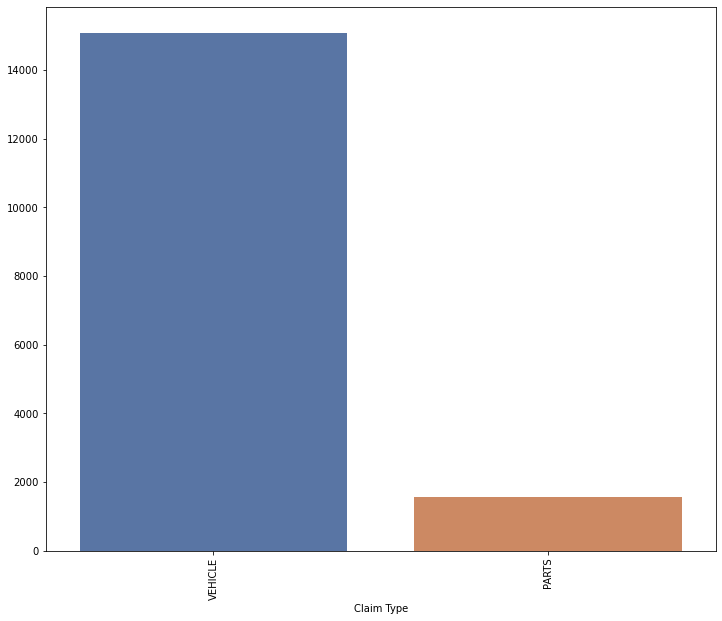

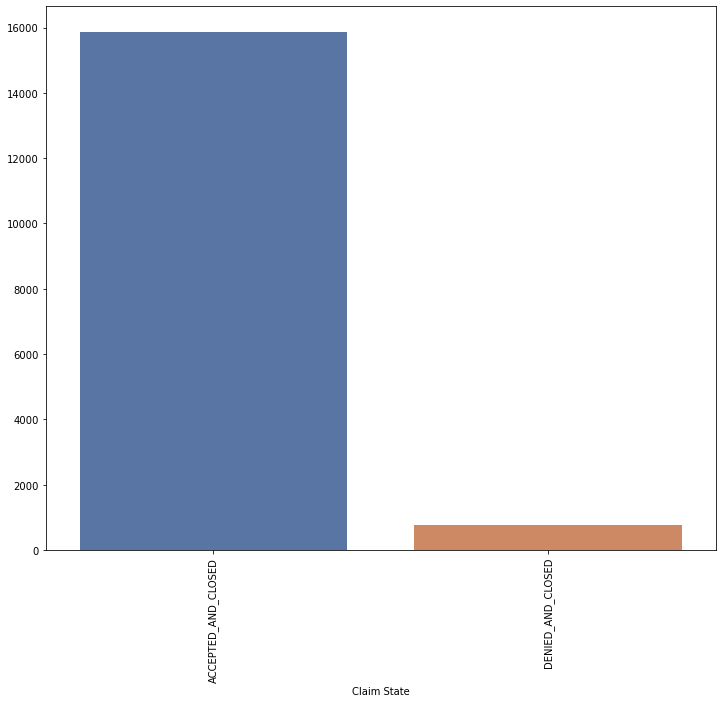

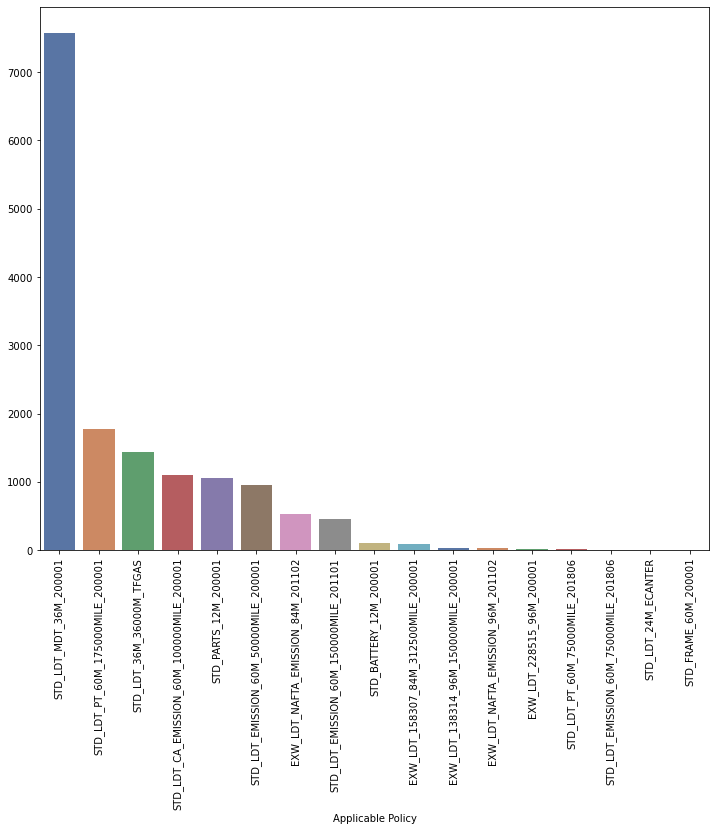

Plotting only top(in decending order) 50 categories


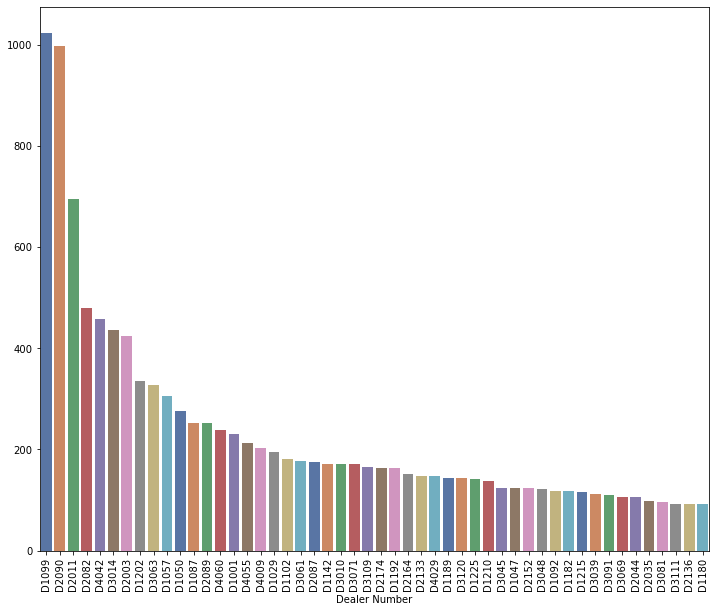

Plotting only top(in decending order) 50 categories


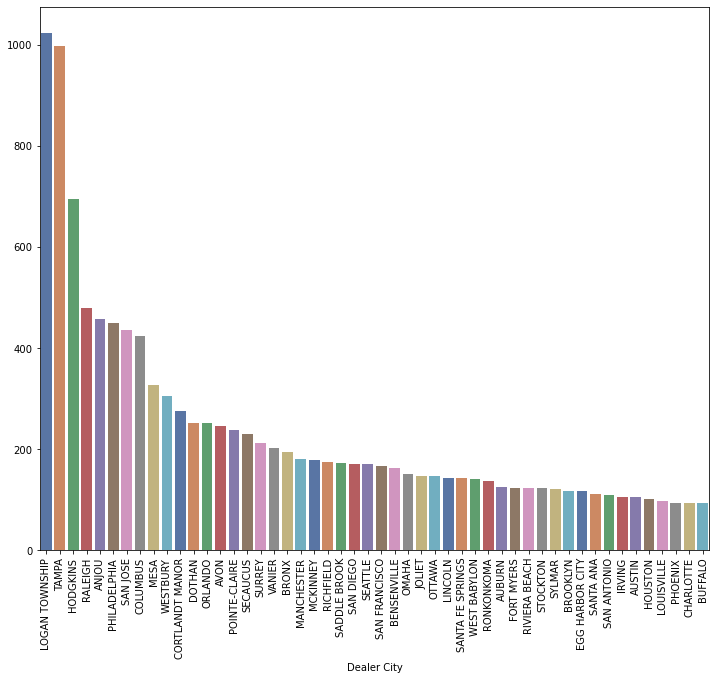

Plotting only top(in decending order) 50 categories


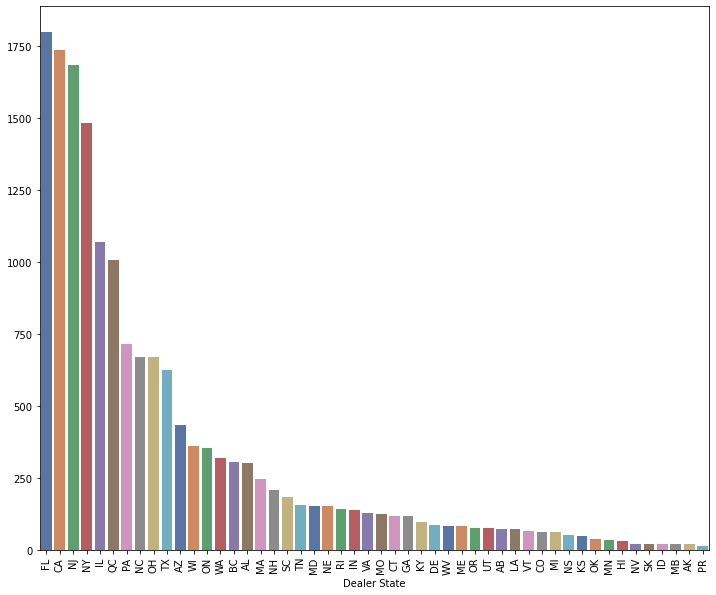

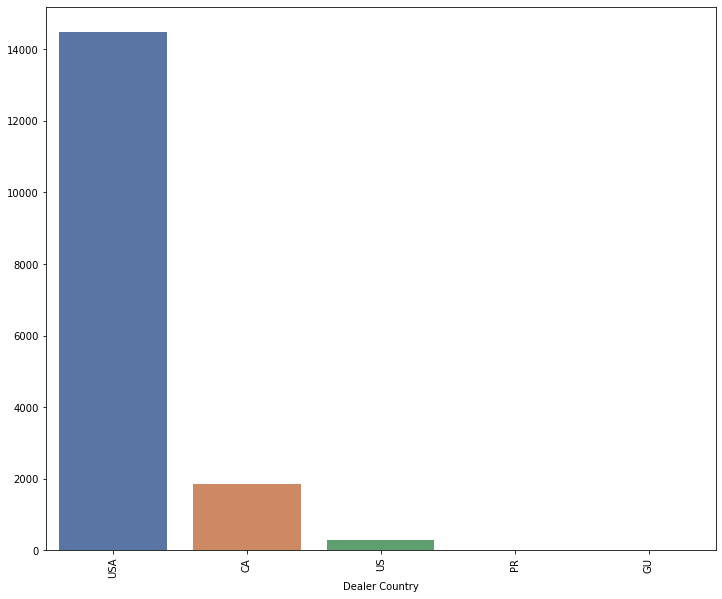

Plotting only top(in decending order) 50 categories


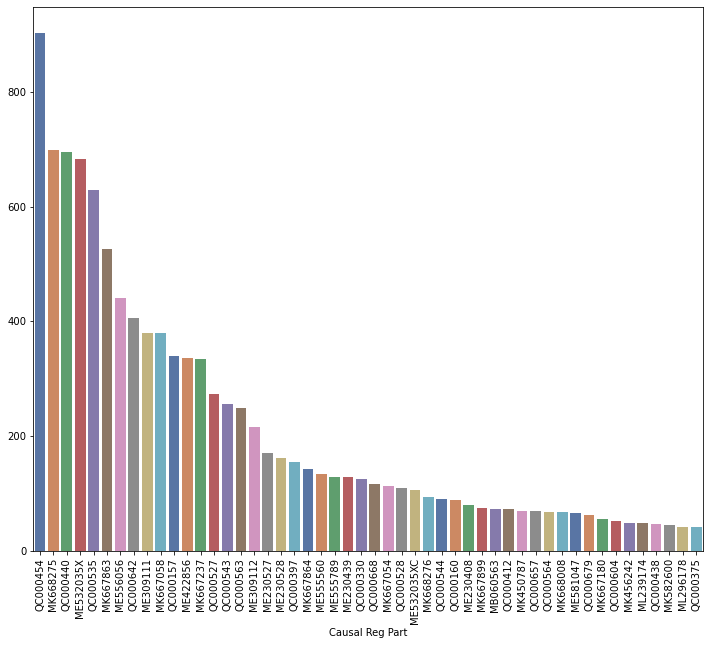

Plotting only top(in decending order) 50 categories


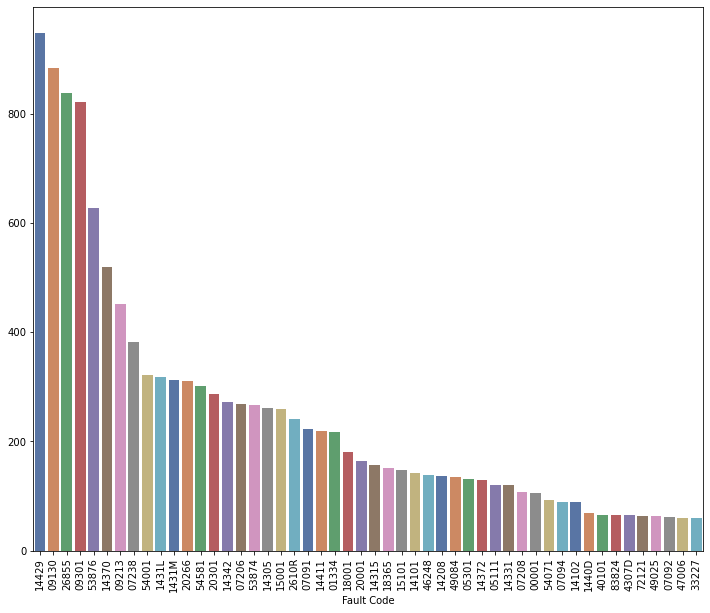

Plotting only top(in decending order) 50 categories


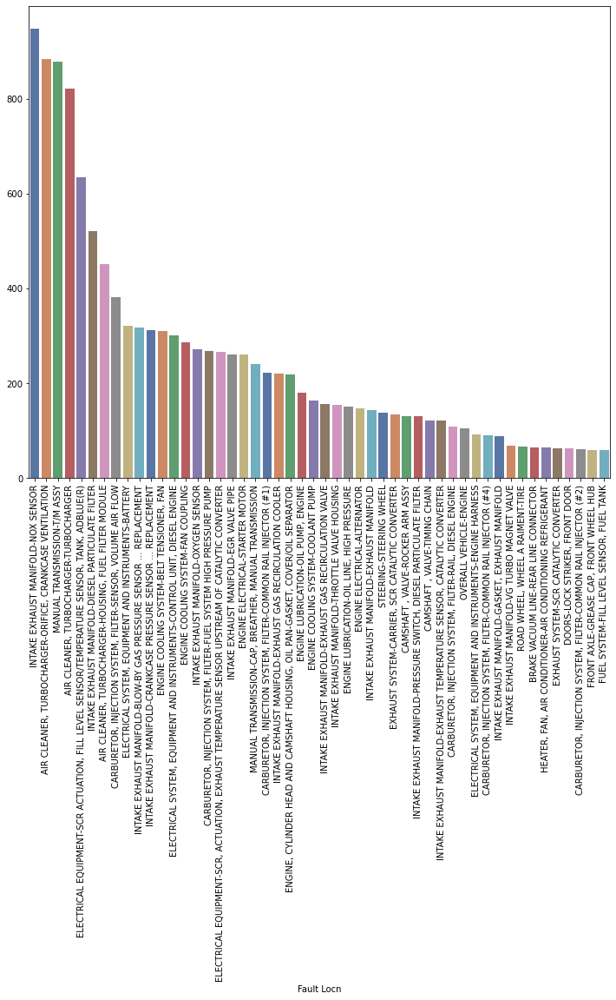

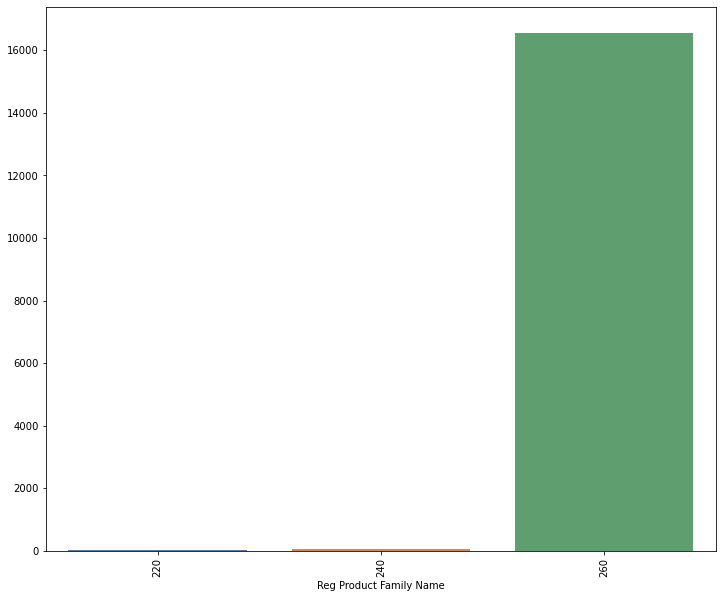

Plotting only top(in decending order) 50 categories


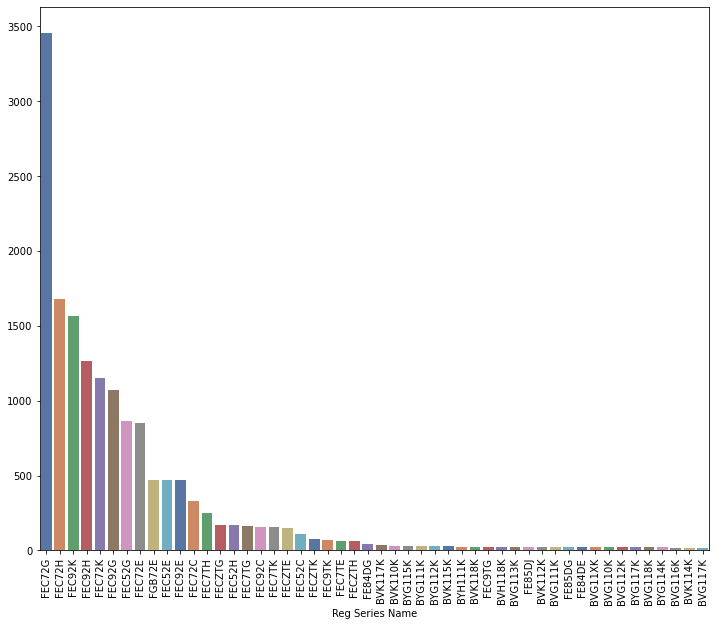

Plotting only top(in decending order) 50 categories


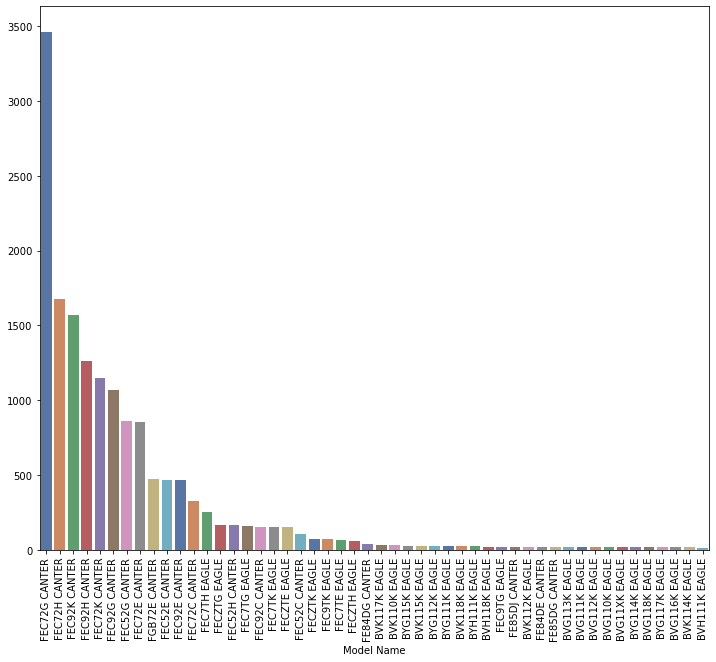

Plotting only top(in decending order) 50 categories


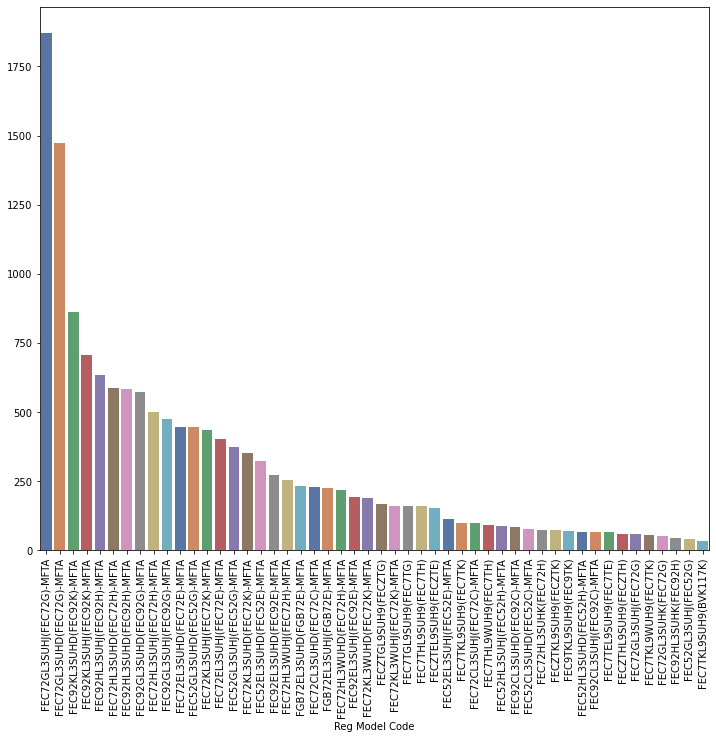

Plotting only top(in decending order) 50 categories


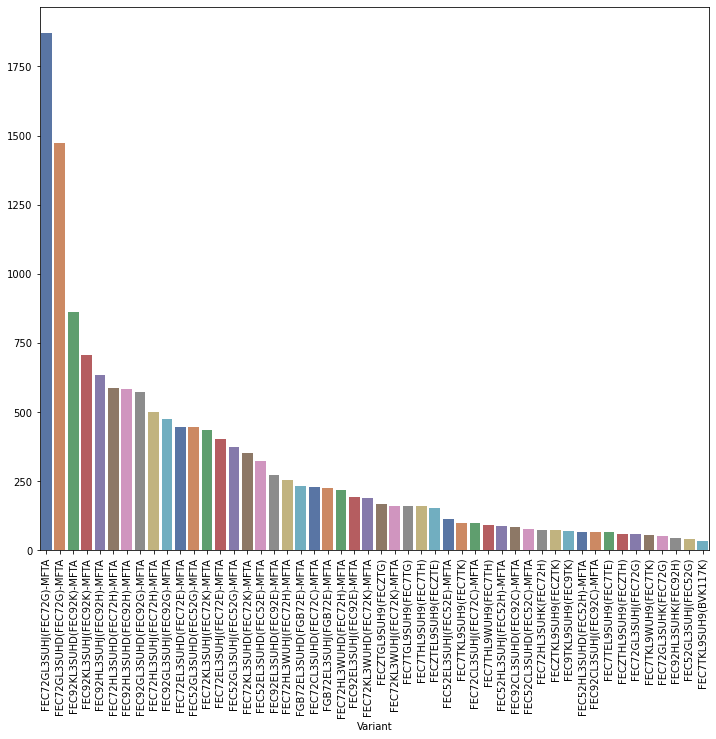

In [9]:
eu.plot_univariate_categorical_columns(claims_with_amount[cols_to_plot_cat], x_rotation=90, plot_limit=50)

#### distributions

In [10]:
claims_with_amount.dtypes

CLAIM_NUMBER                  int64
FAILURE_DATE                 object
REPAIR_DATE                  object
FILED_ON_DATE                object
CLAIM_TYPE                   object
CLAIM_STATE                  object
DELIVERY_DATE                object
UNITS_USAGE                 float64
STOCK_RETAIL                 object
WARNTY_START_DATE            object
WARNTY_END_DATE              object
APPLICABLE_POLICY            object
REGISTRATION_DATE            object
SERIAL_NUMBER                object
DEALER_NUMBER                object
DEALER_NAME                  object
DEALER_CITY                  object
DEALER_STATE                 object
DEALER_COUNTRY               object
PARENT_DEALER                object
CLAIMED_AMOUNT              float64
CLAIM_PAID_AMOUNT           float64
PARTS_COST                  float64
TOTAL_NON_OEM_AMT           float64
LABOR_COST                  float64
OTHER_COST                  float64
CLAIM_ID                      int64
CAUSAL_REG_PART             

In [11]:
num_cols = claims_with_amount.dtypes[claims_with_amount.dtypes == np.float].index

In [12]:
claims_with_amount[num_cols].isnull().sum()


UNITS_USAGE          9
CLAIMED_AMOUNT       0
CLAIM_PAID_AMOUNT    0
PARTS_COST           0
TOTAL_NON_OEM_AMT    0
LABOR_COST           0
OTHER_COST           0
dtype: int64

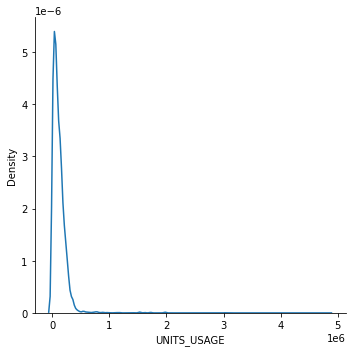

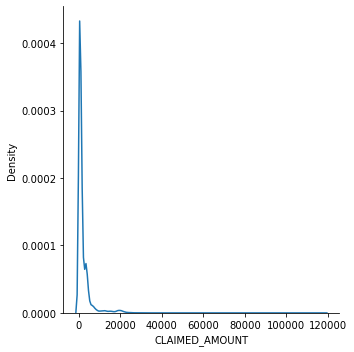

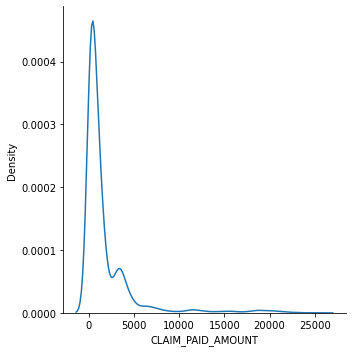

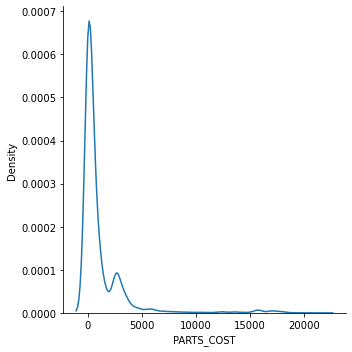

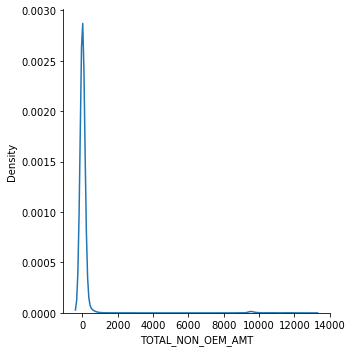

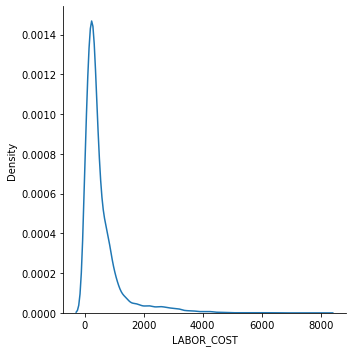

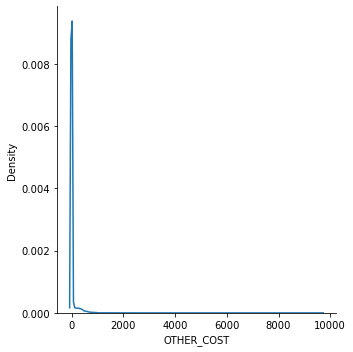

In [13]:
eu.plot_dist(claims_with_amount[num_cols])


## Drop unwanted columns

## Fix column dtypes

#### Plotting numeric and categorical

In [14]:
num_cols, cols_to_plot_cat


(Index(['UNITS_USAGE', 'CLAIMED_AMOUNT', 'CLAIM_PAID_AMOUNT', 'PARTS_COST',
        'TOTAL_NON_OEM_AMT', 'LABOR_COST', 'OTHER_COST'],
       dtype='object'),
 ['CLAIM_TYPE',
  'CLAIM_STATE',
  'APPLICABLE_POLICY',
  'DEALER_NUMBER',
  'DEALER_CITY',
  'DEALER_STATE',
  'DEALER_COUNTRY',
  'CAUSAL_REG_PART',
  'FAULT_CODE',
  'FAULT_LOCN',
  'REG_PRODUCT_FAMILY_NAME',
  'REG_SERIES_NAME',
  'MODEL_NAME',
  'REG_MODEL_CODE',
  'VARIANT'])

In [15]:
len(num_cols), len(cols_to_plot_cat)

(7, 15)

### Bi-variate

### Correlation

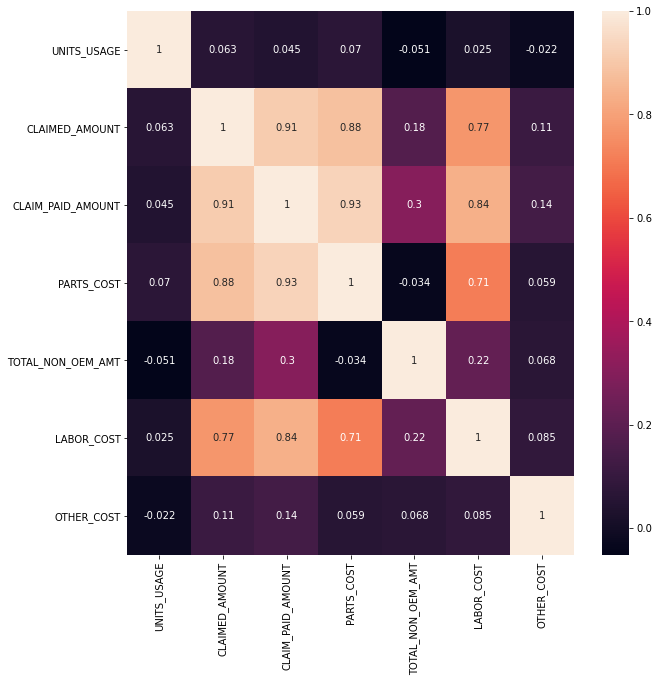

In [16]:
plt.figure(figsize=(10, 10))
sns.heatmap(claims_with_amount[num_cols].corr(), annot=True)
plt.show()

# Mostly positive correlated data

#### Numeric-Numeric (Scatter plot)

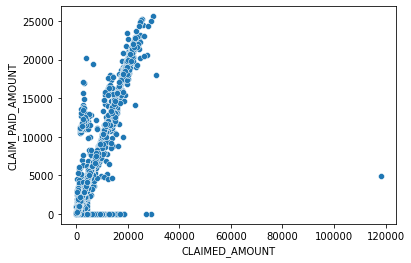

In [17]:
eu.plot_two_variables(claims_with_amount, 'CLAIMED_AMOUNT', 'CLAIM_PAID_AMOUNT')

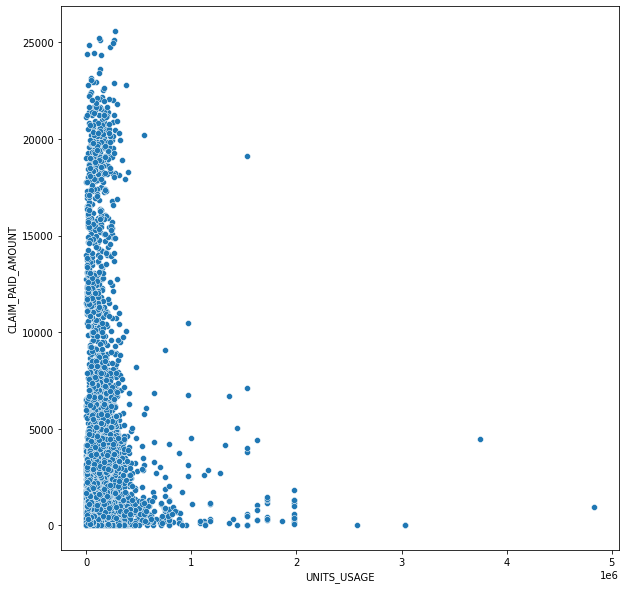

In [18]:
plt.figure(figsize=(10, 10))
eu.plot_two_variables(claims_with_amount, 'UNITS_USAGE', 'CLAIM_PAID_AMOUNT')

####  Numeric-Categorical (Box and violin)


Plotting CLAIM_TYPE vs CLAIM_PAID_AMOUNT



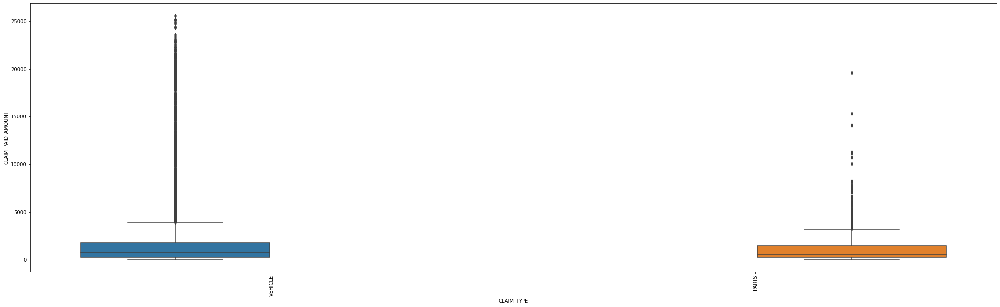


Plotting CLAIM_STATE vs CLAIM_PAID_AMOUNT



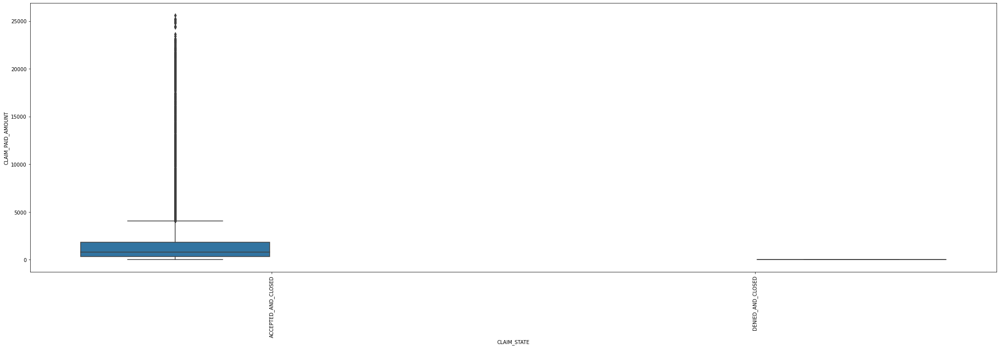


Plotting APPLICABLE_POLICY vs CLAIM_PAID_AMOUNT



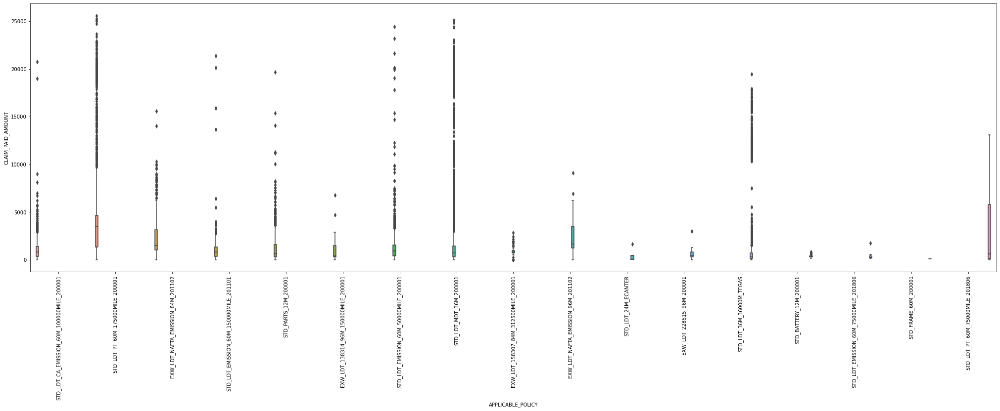


Plotting DEALER_COUNTRY vs CLAIM_PAID_AMOUNT



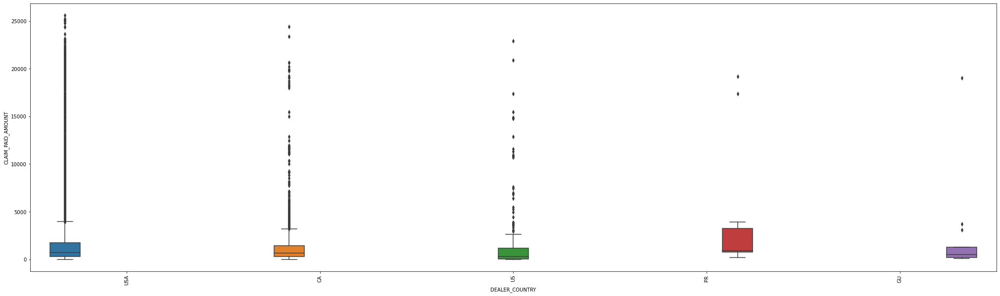


Plotting REG_PRODUCT_FAMILY_NAME vs CLAIM_PAID_AMOUNT



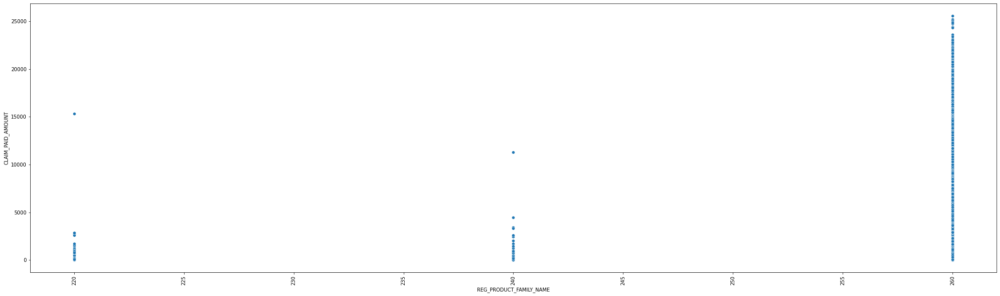


Plotting REG_SERIES_NAME vs CLAIM_PAID_AMOUNT



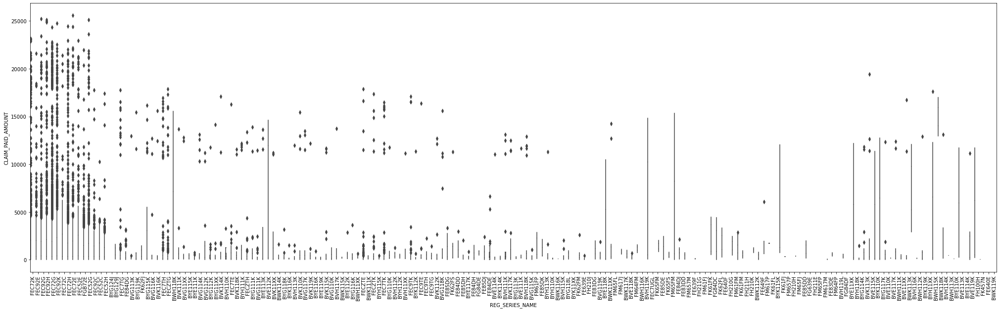


Plotting MODEL_NAME vs CLAIM_PAID_AMOUNT



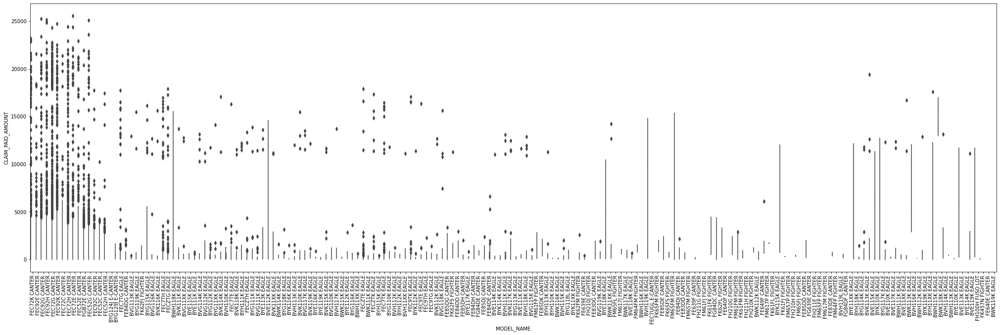


Plotting REG_MODEL_CODE vs CLAIM_PAID_AMOUNT



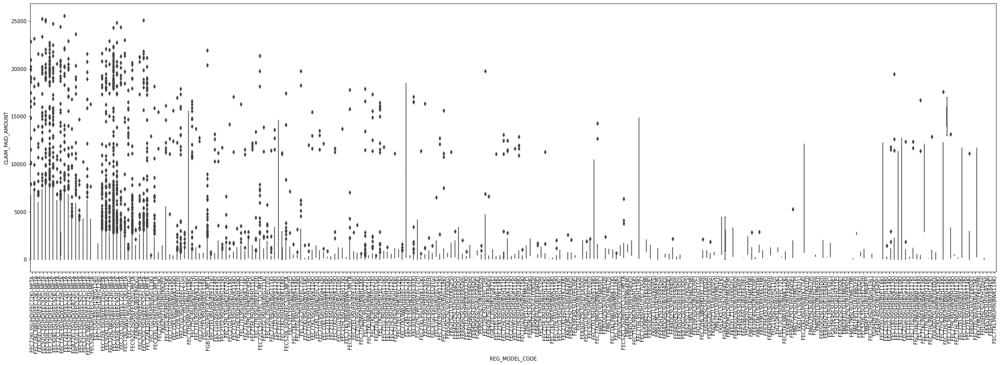


Plotting VARIANT vs CLAIM_PAID_AMOUNT



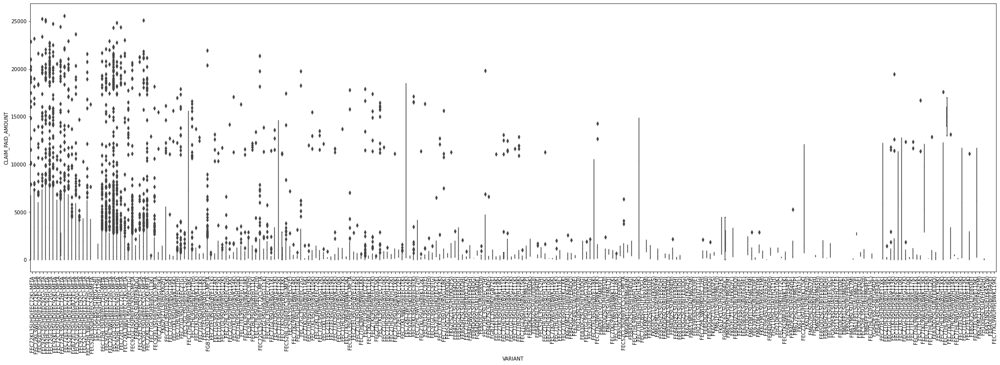

In [19]:
new_cols_cat = cols_to_plot_cat[:]
for rem_col in ["DEALER_NUMBER", "CAUSAL_REG_PART", "DEALER_CITY", "DEALER_STATE", "FAULT_LOCN", "FAULT_CODE"]:
    new_cols_cat.remove(rem_col)
for col in new_cols_cat:
    plt.figure(figsize=(35, 10))
    print(f"\nPlotting {col} vs CLAIM_PAID_AMOUNT\n")
    eu.plot_two_variables(claims_with_amount, col, 'CLAIM_PAID_AMOUNT', x_rotation=90, legend=False)

#### Categorical-Categorical (Cross Table)

In [20]:
pd.crosstab(claims_with_amount['CLAIM_TYPE'], claims_with_amount['CLAIM_STATE'])

CLAIM_STATE,ACCEPTED_AND_CLOSED,DENIED_AND_CLOSED
CLAIM_TYPE,,
PARTS,1369,181
VEHICLE,14490,596


Print a data frame with color